# Web Scraping for Indeed.com & Predicting Salaries

In [123]:
## https://docs.google.com/presentation/d/1EmZZh9QuGJGhc_x1M0tTMW-qrrDcX4Z6cx4Knszzs-U/edit?usp=sharing

In this project, we will practice two major skills: collecting data by scraping a website and then building a binary classifier.

We are going to collect salary information on data science jobs in a variety of markets. Then using the location, title and summary of the job we will attempt to predict the salary of the job. For job posting sites, this would be extraordinarily useful. While most listings DO NOT come with salary information (as you will see in this exercise), being to able extrapolate or predict the expected salaries from other listings can help guide negotiations.

Normally, we could use regression for this task; however, we will convert this problem into classification and use a random forest regressor, as well as another classifier of your choice; either logistic regression, SVM, or KNN. 

- **Question**: Why would we want this to be a classification problem?
- **Answer**: While more precision may be better, there is a fair amount of natural variance in job salaries - predicting a range be may be useful.

Therefore, the first part of the assignment will be focused on scraping Indeed.com. In the second, we'll focus on using listings with salary information to build a model and predict additional salaries.

### Scraping job listings from Indeed.com

We will be scraping job listings from Indeed.com using BeautifulSoup. Luckily, Indeed.com is a simple text page where we can easily find relevant entries.

First, look at the source of an Indeed.com page: (http://www.indeed.com/jobs?q=data+scientist+%2420%2C000&l=New+York&start=10")

Notice, each job listing is underneath a `div` tag with a class name of `result`. We can use BeautifulSoup to extract those. 

#### Setup a request (using requests) to the URL below. Use BeautifulSoup to parse the page and extract all results (HINT: Look for div tags with class name result)
The URL here has many query parameters
- q for the job search
- This is followed by "+20,000" to return results with salaries (or expected salaries >$20,000)
- l for a location
- start for what result number to start on

## Prepre the test data

In [1]:
%matplotlib inline 

import pandas as pd
import numpy as np
from sklearn import cluster
from sklearn import metrics
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot') 
import seaborn as sns

## load the Datasets
Analyst = pd.read_csv("result_Data_Analyst.csv")
Scientist = pd.read_csv("result_Data_Scientist.csv")

In [2]:
## seprate city and state
Analyst['City'] = Analyst['Location'].str.rpartition(', ')[0].str.replace(", ", " ")
Analyst['State']    = Analyst['Location'].str.rpartition(', ')[2]
Analyst[[u'Unnamed: 0', u'Company_name', u'Location', u'Salary', u'Title',
       u'Experience', u'City', u'State']]
## put NAN for united state
Analyst['City'] = Analyst['City'].replace({'': np.nan})
Analyst.to_csv('result_Data_Analyst_seprate.csv', encoding='utf-8')

In [3]:
## seprate city and state
Scientist['City'] = Scientist['Location'].str.rpartition(', ')[0].str.replace(", ", " ")
Scientist['State']    =Scientist['Location'].str.rpartition(', ')[2]
Scientist[[u'Unnamed: 0', u'Company_name', u'Location', u'Salary', u'Title',
       u'Experience', u'City', u'State']]
## put NAN for united state
Scientist['City'] = Scientist['City'].replace({'': np.nan})
Scientist.to_csv('result_Data_Scientist_seprate.csv', encoding='utf-8')

## explore data

In [4]:
Analyst.shape

(4725, 8)

In [5]:
Scientist.shape

(2558, 8)

In [6]:
Scientist.head()

,Unnamed: 0,Company_name,Location,Salary,Title,Experience,City,State
0,0,Predictive Science,United States,75000.0,Data_Scientist,Entry_level,NaN,United States
1,1,Engility Corporation,"Bethesda, MD 20892",75000.0,Data_Scientist,Entry_level,Bethesda,MD 20892
2,2,Massachusetts Institute of Technology ...,"Provost, VA",75000.0,Data_Scientist,Entry_level,Provost,VA
3,3,Booz Allen Hamilton,"Washington, DC",75000.0,Data_Scientist,Entry_level,Washington,DC
4,4,Booz Allen Hamilton,"Washington, DC",75000.0,Data_Scientist,Entry_level,Washington,DC


In [7]:
Analyst.head()

,Unnamed: 0,Company_name,Location,Salary,Title,Experience,City,State
0,0,GEICO,"Chevy Chase, MD",60000.0,Data_Analyst,Entry_level,Chevy Chase,MD
1,1,Evolent Health,"Arlington, VA 22203",60000.0,Data_Analyst,Entry_level,Arlington,VA 22203
2,2,Datalogic Solutions Inc,"Chantilly, VA",60000.0,Data_Analyst,Entry_level,Chantilly,VA
3,3,Cipher3,"Washington, DC",60000.0,Data_Analyst,Entry_level,Washington,DC
4,4,"Interfolio, Inc","Washington, DC 20036 (Downtown area)",60000.0,Data_Analyst,Entry_level,Washington,DC 20036 (Downtown area)


In [8]:
## drop duplicated row
Analyst = Analyst.drop_duplicates()
Analyst.shape

(4724, 8)

In [9]:
## drop duplicated row
Scientist=Scientist.drop_duplicates()
Scientist.shape

(2557, 8)

In [10]:
## drop NAN
Analyst = Analyst.dropna()
Analyst.shape

(4711, 8)

In [11]:
## drop NAN
Scientist = Scientist.dropna()
Scientist.shape



(2545, 8)

In [12]:
## save the new data
Analyst.to_csv('result_Data_Analyst_seprate.csv', encoding='utf-8')

In [13]:
## save the new data
Scientist.to_csv('result_Data_Scientist_seprate.csv', encoding='utf-8')

In [14]:
med_Analyst = Analyst.median()
print(med_Analyst)

Unnamed: 0       52.0
Salary        85000.0
dtype: float64


In [15]:
med_Scientist = Scientist.median()
print(med_Scientist)

Unnamed: 0        30.0
Salary        105000.0
dtype: float64


In [16]:
med_Analyst = Analyst.groupby('Location').median()
print(med_Analyst)

                                                    Unnamed: 0    Salary
Location                                                                
Alexandria, VA                                            51.0   75000.0
Alexandria, VA 22303                                     100.0  100000.0
Alexandria, VA 22311 (Alexandria Wrest area)              51.0   85000.0
Alexandria, VA 22314                                     103.0  100000.0
Alexandria, VA 22314 (Southwest Quadrant area)            64.0   75000.0
Anacostia, DC                                            104.0   72500.0
Andrews AFB, MD                                           58.0   70000.0
Annapolis Junction, MD                                    82.0  100000.0
Annapolis Junction, MD 20701                              85.0   70000.0
Annapolis, MD                                            102.0  100000.0
Arlington, VA                                             58.0   75000.0
Arlington, VA 22201 (Lyon Village area)            

In [17]:
med_Scientist = Scientist.groupby('Location').median()
print(med_Scientist)

                                                   Unnamed: 0    Salary
Location                                                               
Adelphi, MD                                              12.0  110000.0
Alexandria, VA                                           17.0   90000.0
Alexandria, VA 22303                                     25.0  105000.0
Alexandria, VA 22304 (Seminary Hill area)                37.0   82500.0
Alexandria, VA 22314 (Southwest Quadrant area)           10.0   75000.0
Allendale, NJ                                            48.0   92500.0
Annapolis Junction, MD 20701                             48.0   97500.0
Arlington, VA                                            24.0   90000.0
Arlington, VA 22201 (Lyon Village area)                  18.0   90000.0
Arlington, VA 22203 (Bluemont area)                      18.0  105000.0
Arlington, VA 22209                                      55.0   75000.0
Arlington, VA 22209 (Radnor-Ft Myer Heights area)        30.5   

In [18]:
## above or below median
Scientist["classify_salary"] = 0
Scientist["classify_salary"][Scientist["Salary"] >= 105000.0] = 1
Scientist.head()

/anaconda/envs/py27/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


,Unnamed: 0,Company_name,Location,Salary,Title,Experience,City,State,classify_salary
1,1,Engility Corporation,"Bethesda, MD 20892",75000.0,Data_Scientist,Entry_level,Bethesda,MD 20892,0
2,2,Massachusetts Institute of Technology ...,"Provost, VA",75000.0,Data_Scientist,Entry_level,Provost,VA,0
3,3,Booz Allen Hamilton,"Washington, DC",75000.0,Data_Scientist,Entry_level,Washington,DC,0
4,4,Booz Allen Hamilton,"Washington, DC",75000.0,Data_Scientist,Entry_level,Washington,DC,0
5,5,Booz Allen Hamilton,"Alexandria, VA",75000.0,Data_Scientist,Entry_level,Alexandria,VA,0


In [19]:
Analyst["classify_salary"] = 0
Analyst["classify_salary"][Analyst["Salary"] >= 85000.0] = 1
Analyst.head()

/anaconda/envs/py27/lib/python2.7/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


,Unnamed: 0,Company_name,Location,Salary,Title,Experience,City,State,classify_salary
0,0,GEICO,"Chevy Chase, MD",60000.0,Data_Analyst,Entry_level,Chevy Chase,MD,0
1,1,Evolent Health,"Arlington, VA 22203",60000.0,Data_Analyst,Entry_level,Arlington,VA 22203,0
2,2,Datalogic Solutions Inc,"Chantilly, VA",60000.0,Data_Analyst,Entry_level,Chantilly,VA,0
3,3,Cipher3,"Washington, DC",60000.0,Data_Analyst,Entry_level,Washington,DC,0
4,4,"Interfolio, Inc","Washington, DC 20036 (Downtown area)",60000.0,Data_Analyst,Entry_level,Washington,DC 20036 (Downtown area),0


## Categorical Features Distributions
Investigate the relation of each categorical feature with the salary class:

- location
- company name
- Experience


Use a bar-chart to visualize the relative frequency of each of the  elements in the group.
Use two colors to distinguish between the low and high salary class.




## Experience_Analyst

In [20]:
Analyst_dummies_experience  = pd.get_dummies(Analyst['Experience'])

In [21]:
Analyst_dummies_experience.columns

Index([u'Entry_level', u'Mid_level', u'Senior_level'], dtype='object')

In [22]:
Analyst_dummies_experience.columns =[u'Entry_level', u'Mid_level', u'Senior_level']

In [23]:
Analyst_dummies_experience.drop(['Senior_level'], axis=1, inplace=True)

In [24]:
Analyst =Analyst.join(Analyst_dummies_experience)

In [25]:
Analyst.head()

,Unnamed: 0,Company_name,Location,Salary,Title,Experience,City,State,classify_salary,Entry_level,Mid_level
0,0,GEICO,"Chevy Chase, MD",60000.0,Data_Analyst,Entry_level,Chevy Chase,MD,0,1.0,0.0
1,1,Evolent Health,"Arlington, VA 22203",60000.0,Data_Analyst,Entry_level,Arlington,VA 22203,0,1.0,0.0
2,2,Datalogic Solutions Inc,"Chantilly, VA",60000.0,Data_Analyst,Entry_level,Chantilly,VA,0,1.0,0.0
3,3,Cipher3,"Washington, DC",60000.0,Data_Analyst,Entry_level,Washington,DC,0,1.0,0.0
4,4,"Interfolio, Inc","Washington, DC 20036 (Downtown area)",60000.0,Data_Analyst,Entry_level,Washington,DC 20036 (Downtown area),0,1.0,0.0


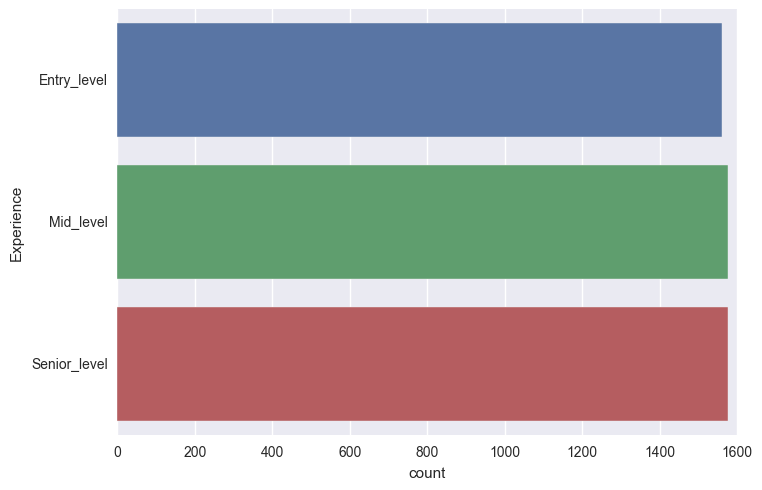

In [117]:
import matplotlib.pyplot as plt
fig=sns.countplot(y='Experience', data=Analyst)
#fig.savefig('ana_count.png', dpi=fig.dpi)

## Experience_Scientist


In [27]:
Scientist_dummies_experience  = pd.get_dummies(Scientist['Experience'])

In [28]:
Scientist_dummies_experience.columns =[u'Entry_level', u'Mid_level', u'Senior_level']

In [29]:
Scientist_dummies_experience.drop(['Senior_level'], axis=1, inplace=True)

In [30]:
Scientist =Scientist.join(Scientist_dummies_experience)

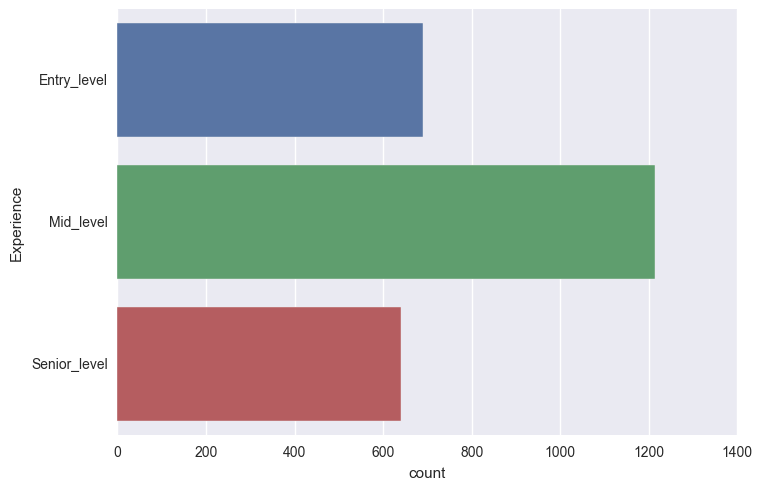

In [31]:
sns.countplot(y='Experience', data=Scientist)

## location (Analyst)


In [32]:
Analyst_dummies_location  = pd.get_dummies(Analyst['City'])

In [33]:
col =Analyst_dummies_location.columns

In [34]:
list1=[]
for ii in col:
    list1.append(ii)

In [35]:
Analyst_dummies_location.columns = list1

In [36]:
Analyst_dummies_location.drop(['Alexandria'], axis=1, inplace=True)

In [37]:
Analyst =Analyst.join(Analyst_dummies_location)

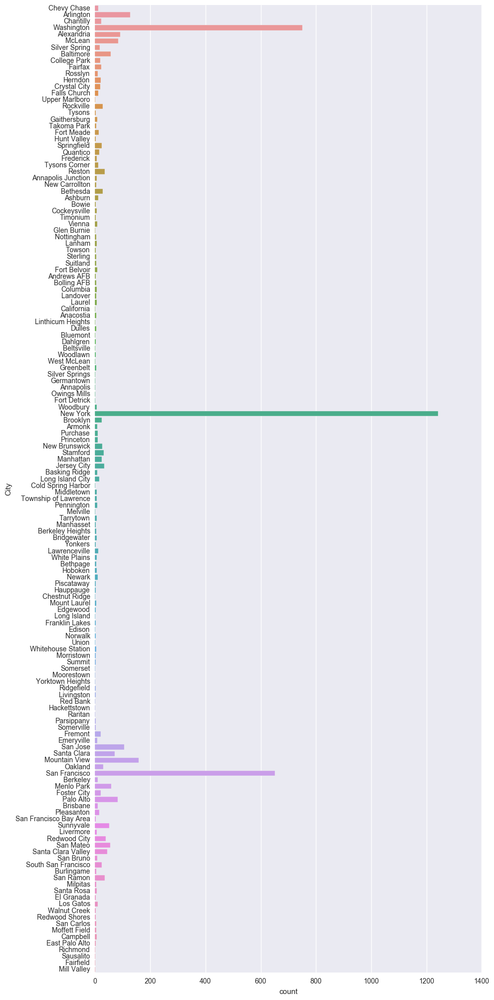

In [38]:

plt.figure(figsize=(10,25))
sns.countplot(y='City', data=Analyst)


## location (Scientist)

In [39]:
Scientist_dummies_location  = pd.get_dummies(Scientist['City'])


In [40]:
col =Scientist_dummies_location.columns 

In [41]:
list1=[]
for ii in col:
    list1.append(ii)

In [42]:
Scientist_dummies_location.columns = list1

In [43]:
Scientist_dummies_location.drop(['Alexandria'], axis=1, inplace=True)

In [44]:
Scientist =Scientist.join(Scientist_dummies_location)

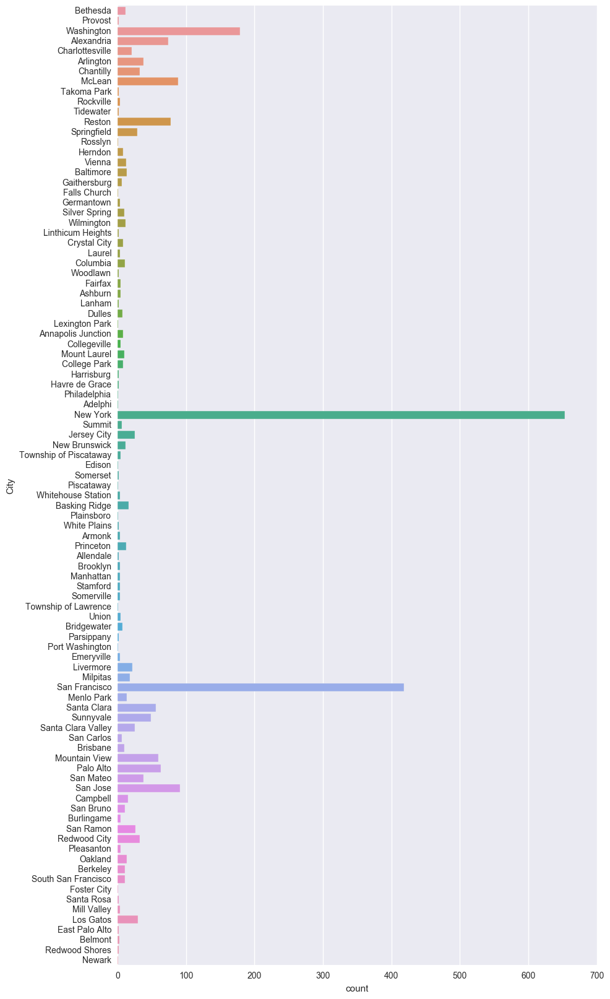

In [45]:

plt.figure(figsize=(10,20))
sns.countplot(y='City', data=Scientist)


## Company name(Analyst)

In [46]:
Analyst_dummies_Company_name  = pd.get_dummies(Analyst['Company_name'])

In [47]:
col=Analyst_dummies_Company_name.columns

In [48]:
list1=[]
for ii in col:
    str(ii).replace('   ','')
    list1.append(ii)
    

In [49]:

Analyst_dummies_Company_name.columns=list1

In [50]:
Analyst_dummies_Company_name.drop(['        1010data'], axis=1, inplace=True)

In [51]:
Analyst =Analyst.join(Analyst_dummies_Company_name)

In [52]:
import sys
reload(sys)
sys.setdefaultencoding('utf-8')

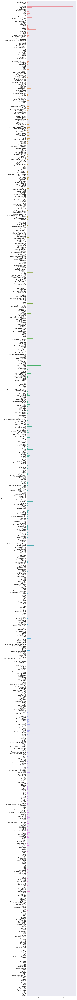

In [53]:
plt.figure(figsize=(10,200))
sns.countplot(y='Company_name', data=Analyst)

## Company name(Scientist)

In [54]:
Scientist_dummies_Company_name  = pd.get_dummies(Scientist['Company_name'])

In [55]:
col =Scientist_dummies_Company_name.columns 

In [56]:
list1=[]
for ii in col:
    list1.append(ii)

In [57]:
list1

['        2U',
 '        A9.com',
 '        AIG',
 '        ANALYTICA',
 '        ASML',
 '        ASRC Federal',
 '        Absolutdata',
 '        Accenture',
 '        AdRoll',
 '        Adobe',
 '        Aetna',
 '        AgilOne',
 '        Agilent',
 '        Airtime',
 '        Altamira Technologies Corporation',
 '        Amazon Corporate LLC',
 '        Amazon Web Services, Inc.',
 '        American Society of Clinical Oncology',
 '        Amherst',
 '        Analytic Recruiting',
 '        Ancestry',
 '        Apex Systems Inc',
 '        Apple',
 '        AppleOne',
 '        Applied Information Sciences',
 '        Appnomic Systems Pvt. Ltd',
 '        AstraZeneca',
 '        BAE Systems',
 '        Barbaricum',
 '        Bay State',
 '        Bayside Solutions',
 '        Bechtel',
 '        Berico Technologies',
 '        Big Fish',
 '        Bloomberg',
 '        Booz Allen Hamilton',
 '        BridgeView IT',
 '        Brighterion',
 '        BuzzFeed',
 '        CA Tech

In [58]:
Scientist_dummies_Company_name.columns=list1

In [59]:
Scientist_dummies_Company_name.drop(['        2U'], axis=1, inplace=True)

In [60]:
Scientist =Scientist.join(Scientist_dummies_Company_name)

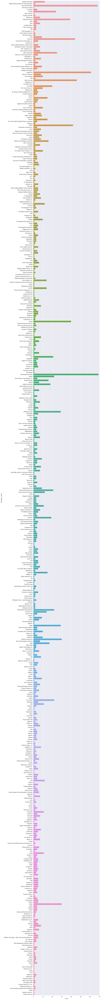

In [61]:
plt.figure(figsize=(10,150))
sns.countplot(y='Company_name', data=Scientist)

In [62]:
## final dataset

In [63]:
Scientist.shape

(2545, 611)

In [64]:
Analyst.shape

(4711, 1425)

In [65]:
Analyst.head()

,Unnamed: 0,Company_name,Location,Salary,Title,Experience,City,State,classify_salary,Entry_level,...,iQuasar,iRhythm,iSoft Solutions,kCura Corporation,phia,thredUP,xometry,쿠팡,Analysts International,"Data Systems Analysts, Inc."
0,0,GEICO,"Chevy Chase, MD",60000.0,Data_Analyst,Entry_level,Chevy Chase,MD,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,Evolent Health,"Arlington, VA 22203",60000.0,Data_Analyst,Entry_level,Arlington,VA 22203,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,Datalogic Solutions Inc,"Chantilly, VA",60000.0,Data_Analyst,Entry_level,Chantilly,VA,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,Cipher3,"Washington, DC",60000.0,Data_Analyst,Entry_level,Washington,DC,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,"Interfolio, Inc","Washington, DC 20036 (Downtown area)",60000.0,Data_Analyst,Entry_level,Washington,DC 20036 (Downtown area),0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [66]:
Scientist.head()

,Unnamed: 0,Company_name,Location,Salary,Title,Experience,City,State,classify_salary,Entry_level,...,Xconic,Yashi,Zendrive,Zone24x7 Inc,Zoomdata,Zymergen,iRhythm,iSoft Solutions,thredUP,xometry
1,1,Engility Corporation,"Bethesda, MD 20892",75000.0,Data_Scientist,Entry_level,Bethesda,MD 20892,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,Massachusetts Institute of Technology ...,"Provost, VA",75000.0,Data_Scientist,Entry_level,Provost,VA,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,Booz Allen Hamilton,"Washington, DC",75000.0,Data_Scientist,Entry_level,Washington,DC,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,Booz Allen Hamilton,"Washington, DC",75000.0,Data_Scientist,Entry_level,Washington,DC,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,5,Booz Allen Hamilton,"Alexandria, VA",75000.0,Data_Scientist,Entry_level,Alexandria,VA,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## make a copy from the final datasets

In [67]:
import copy
DA=copy.deepcopy(Analyst)
DS=copy.deepcopy(Scientist)

In [68]:
## other plots

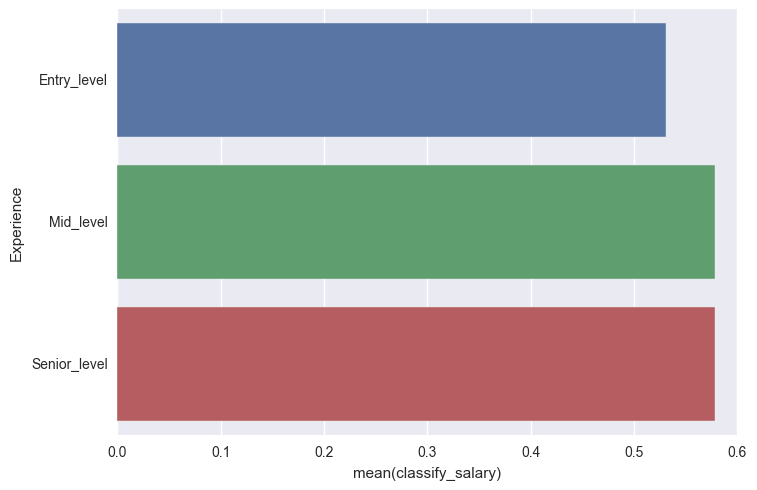

In [69]:
person_perc = Scientist[["Experience", "classify_salary"]].groupby(['Experience'],as_index=False).mean()
sns.barplot(y='Experience', x='classify_salary', data=person_perc)


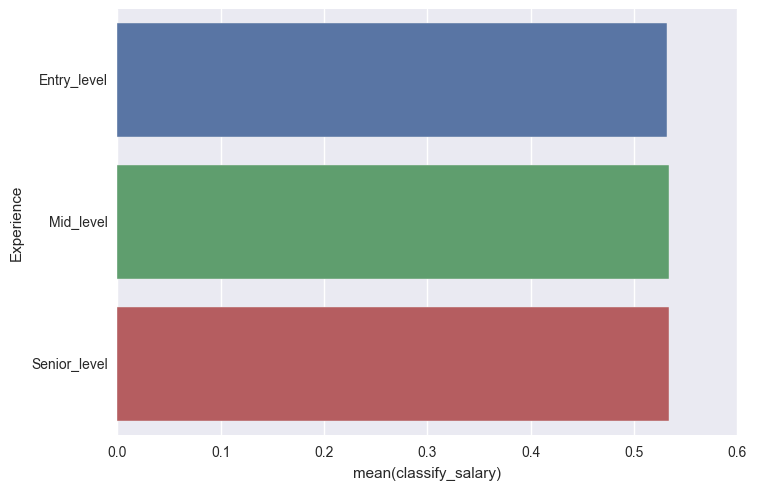

In [70]:
person_perc = Analyst[["Experience", "classify_salary"]].groupby(['Experience'],as_index=False).mean()
sns.barplot(y='Experience', x='classify_salary', data=person_perc)


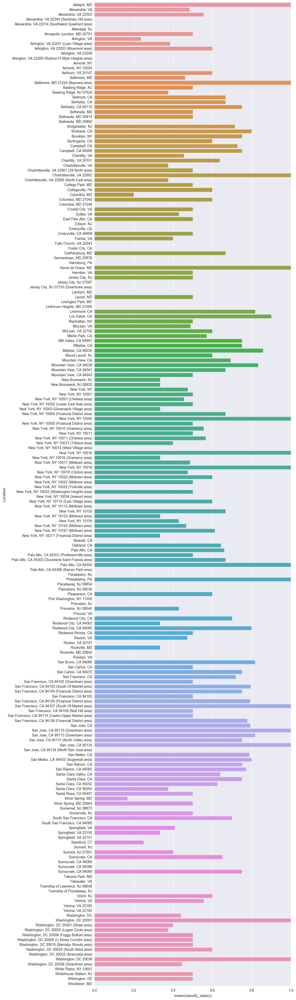

In [71]:
plt.figure(figsize=(10,50))
person_perc = Scientist[["Location", "classify_salary"]].groupby(['Location'],as_index=False).mean()
sns.barplot(y='Location', x='classify_salary', data=person_perc)


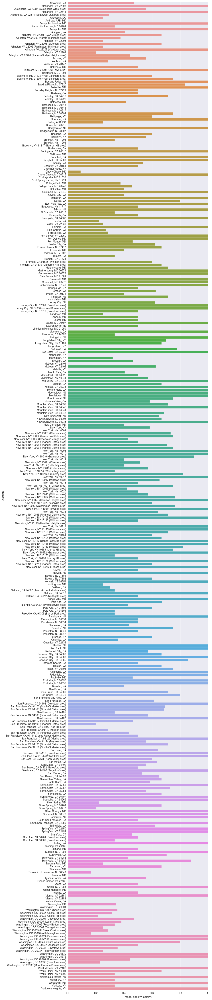

In [72]:
plt.figure(figsize=(10,70))
person_perc = Analyst[["Location", "classify_salary"]].groupby(['Location'],as_index=False).mean()
sns.barplot(y='Location', x='classify_salary', data=person_perc)


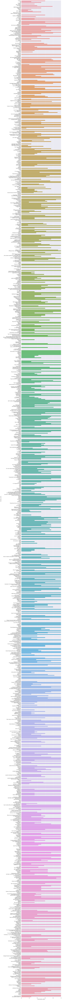

In [73]:
plt.figure(figsize=(10,250))

person_perc = Analyst[["Company_name", "classify_salary"]].groupby(['Company_name'],as_index=False).mean()
sns.barplot(y='Company_name', x='classify_salary', data=person_perc)



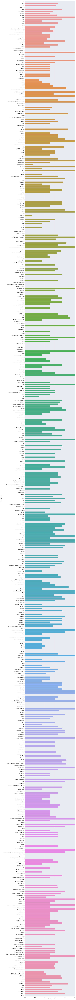

In [74]:
plt.figure(figsize=(10,200))

person_perc = Scientist[["Company_name", "classify_salary"]].groupby(['Company_name'],as_index=False).mean()
sns.barplot(y='Company_name', x='classify_salary', data=person_perc)


## making a model

In [75]:
col1= DS.columns

In [76]:
DS.head()

,Unnamed: 0,Company_name,Location,Salary,Title,Experience,City,State,classify_salary,Entry_level,...,Xconic,Yashi,Zendrive,Zone24x7 Inc,Zoomdata,Zymergen,iRhythm,iSoft Solutions,thredUP,xometry
1,1,Engility Corporation,"Bethesda, MD 20892",75000.0,Data_Scientist,Entry_level,Bethesda,MD 20892,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,Massachusetts Institute of Technology ...,"Provost, VA",75000.0,Data_Scientist,Entry_level,Provost,VA,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,Booz Allen Hamilton,"Washington, DC",75000.0,Data_Scientist,Entry_level,Washington,DC,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,Booz Allen Hamilton,"Washington, DC",75000.0,Data_Scientist,Entry_level,Washington,DC,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,5,Booz Allen Hamilton,"Alexandria, VA",75000.0,Data_Scientist,Entry_level,Alexandria,VA,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [77]:
import copy
X_ana=copy.deepcopy(Analyst)
X_sci=copy.deepcopy(Scientist)

In [78]:
X_ana

,Unnamed: 0,Company_name,Location,Salary,Title,Experience,City,State,classify_salary,Entry_level,...,iQuasar,iRhythm,iSoft Solutions,kCura Corporation,phia,thredUP,xometry,쿠팡,Analysts International,"Data Systems Analysts, Inc."
0,0,GEICO,"Chevy Chase, MD",60000.0,Data_Analyst,Entry_level,Chevy Chase,MD,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,Evolent Health,"Arlington, VA 22203",60000.0,Data_Analyst,Entry_level,Arlington,VA 22203,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,Datalogic Solutions Inc,"Chantilly, VA",60000.0,Data_Analyst,Entry_level,Chantilly,VA,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,Cipher3,"Washington, DC",60000.0,Data_Analyst,Entry_level,Washington,DC,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,"Interfolio, Inc","Washington, DC 20036 (Downtown area)",60000.0,Data_Analyst,Entry_level,Washington,DC 20036 (Downtown area),0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,5,JLL,"Washington, DC",60000.0,Data_Analyst,Entry_level,Washington,DC,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,6,Goodwill Excel Center - DC,"Washington, DC",60000.0,Data_Analyst,Entry_level,Washington,DC,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,7,Booz Allen Hamilton,"Washington, DC",60000.0,Data_Analyst,Entry_level,Washington,DC,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,8,Grant Thornton,"Washington, DC 20036 (Downtown area)",60000.0,Data_Analyst,Entry_level,Washington,DC 20036 (Downtown area),0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,9,FAAZ Consulting LLC,"Washington, DC",60000.0,Data_Analyst,Entry_level,Washington,DC,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [79]:
X_ana.drop([u'Unnamed: 0',u'Company_name',u'Location',u'Salary',u'Title',u'Experience',u'City', u'State',u'classify_salary'], axis=1, inplace=True)


In [80]:
X_ana

,Entry_level,Mid_level,Anacostia,Andrews AFB,Annapolis,Annapolis Junction,Arlington,Armonk,Ashburn,Baltimore,...,iQuasar,iRhythm,iSoft Solutions,kCura Corporation,phia,thredUP,xometry,쿠팡,Analysts International,"Data Systems Analysts, Inc."
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [81]:
# Set up fake X and Y
#Analyst_dummies_experience
X = X_ana

Y = Analyst["classify_salary"]

from sklearn.linear_model import LogisticRegressionCV
import numpy as np

logreg = LogisticRegressionCV(cv=5)
logreg.fit(X, Y)

# coefficients:
cocv =logreg.coef_
intcv =logreg.intercept_

In [82]:
cocv

array([[-0.17497859,  0.35937664, -1.70788484, ...,  6.44835244,
         6.58003927, -0.72162967]])

In [83]:
intcv

array([ 0.31001176])

In [84]:
import numpy as np
import pandas as pd
from sklearn.cross_validation import train_test_split
from sklearn.linear_model import LogisticRegression

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.33,random_state=99)
X_train.size


4468896

In [118]:
logreg = LogisticRegressionCV(cv=5)
logreg.fit(X_train, Y_train)
Y_pred = logreg.predict(X_test)

In [86]:
from sklearn.metrics import confusion_matrix

confusion = np.array(confusion_matrix(Y_test, Y_pred))

confusion


array([[330, 425],
       [201, 599]])

In [120]:
cvs = [1,2,3,5,10,15]
grid = GridSearchCV(estimator=logreg, param_grid=dict(cv=cvs ))
#grid_coef = grid.fit(X_train, Y_train)
#print(grid)
#grid.best_score_

In [122]:
grid

GridSearchCV(cv=None, error_score='raise',
       estimator=LogisticRegressionCV(Cs=10, class_weight=None, cv=5, dual=False,
           fit_intercept=True, intercept_scaling=1.0, max_iter=100,
           multi_class='ovr', n_jobs=1, penalty='l2', random_state=None,
           refit=True, scoring=None, solver='lbfgs', tol=0.0001, verbose=0),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'cv': [1, 2, 3, 5, 10, 15]}, pre_dispatch='2*n_jobs',
       refit=True, scoring=None, verbose=0)

In [87]:
# calculate true positives, the number of 1s correctly predicted to be 1
TP = confusion[0,0]

# calculate false positives, the number of 0s incorrectly predicted to be 1
FP  = confusion[1,0]

# calculate true negatives, the number of 0s correctly predicted to be 0
TN = confusion[1,1]

# calculate false negatives, the number of 1s incorrectly predicted to be 0
FN = confusion[0,1]



In [88]:
from sklearn.metrics import accuracy_score

acc = accuracy_score(Y_test, Y_pred)
acc


0.59742765273311893

In [89]:
## knn

In [90]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=50)
knn.fit(X_train, Y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=50, p=2,
           weights='uniform')

In [91]:
from sklearn import metrics
y_pred_class = knn.predict(X_test)
accu= metrics.accuracy_score(Y_test, y_pred_class)

In [92]:
accu

0.59935691318327977

## Gridsearch

In [93]:
from sklearn.linear_model import Ridge
from sklearn.grid_search import GridSearchCV

In [94]:
## Prepare a Range of Alpha Values to Test
k_vals = [ 1,5,10,50,75,100,200,250]
knn = KNeighborsClassifier()

In [95]:
## Create and Fit a GridSearchCV Model

grid = GridSearchCV(estimator=knn, param_grid=dict(n_neighbors=k_vals ))
grid_coef = grid.fit(X_train, Y_train)
print(grid)
grid.best_score_

0.58333333333333337

In [96]:
grid

GridSearchCV(cv=None, error_score='raise',
       estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=5, p=2,
           weights='uniform'),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'n_neighbors': [1, 5, 10, 50, 75, 100, 200, 250]},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=0)

In [97]:
grid.best_params_

{'n_neighbors': 100}

In [98]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=100)
knn.fit(X_train, Y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=100, p=2,
           weights='uniform')

In [99]:
from sklearn import metrics
y_pred_class = knn.predict(X_test)
scknn=metrics.accuracy_score(Y_test, y_pred_class)

In [100]:
scknn

0.59935691318327977

In [ ]:
## random farest

In [108]:
from sklearn.cross_validation import cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, BaggingClassifier
cv = StratifiedKFold(Y, n_folds=3, shuffle=True, random_state=41)

rf = RandomForestClassifier(n_jobs=-1)
rf.fit(X_train,Y_train)
y_pred_randomforest = rf.predict(X_test)
scrf=metrics.accuracy_score(Y_test, y_pred_randomforest)
s = cross_val_score(rf, X, Y, cv=cv,n_jobs=-1)
#print "{} Score:\t{:0.3} ± {:0.3}".format("RandomForestClassifier", s.mean().round(3), s.std().round(3))


In [110]:
s.mean().round(3)

0.58499999999999996

In [111]:
s.std().round(3)

0.014

In [112]:
s

array([ 0.57161044,  0.60407384,  0.57871256])

In [113]:
scrf

0.59678456591639872